In [29]:
import torch

torch.cuda.is_available()

True

In [30]:
torch.cuda.get_device_name(0)

'NVIDIA GeForce RTX 4060 Laptop GPU'

In [31]:
torch.cuda.device_count()

1

In [32]:
import torch
from torchvision.datasets import ImageFolder
import numpy as np
from torch.utils.data import DataLoader

from convNext import convnext_base
from de_convNext import de_convnext_base
from BN_conv import bn_conv
from dataset import get_data_transforms, load_data , RD_Dataset

from torchvision import transforms # 전처리 모듈


from torch.nn import functional as F
from sklearn.metrics import roc_auc_score
import cv2
import matplotlib.pyplot as plt
from sklearn.metrics import auc
from skimage import measure
import pandas as pd
from numpy import ndarray
from statistics import mean
from scipy.ndimage import gaussian_filter
from sklearn import manifold
from matplotlib.ticker import NullFormatter
from scipy.spatial.distance import pdist
import matplotlib
import pickle
import os

In [33]:
# Teacher와 Student의 Feature map을 받아와 Anomaly map을 생성하는 함수
def cal_anomaly_map(fs_list, ft_list, out_size=224, amap_mode='mul'):
    if amap_mode == 'mul':
        anomaly_map = np.ones([out_size, out_size])
    else:
        anomaly_map = np.zeros([out_size, out_size])
    a_map_list = []
    for i in range(len(ft_list)):
        fs = fs_list[i]
        ft = ft_list[i]
        #fs_norm = F.normalize(fs, p=2)
        #ft_norm = F.normalize(ft, p=2)
        a_map = 1 - F.cosine_similarity(fs, ft)
        a_map = torch.unsqueeze(a_map, dim=1)
        a_map = F.interpolate(a_map, size=out_size, mode='bilinear', align_corners=True)
        a_map = a_map[0, 0, :, :].to('cpu').detach().numpy()
        a_map_list.append(a_map)
        if amap_mode == 'mul':
            anomaly_map *= a_map
        else:
            anomaly_map += a_map
    return anomaly_map, a_map_list

In [34]:
# CAM을 생성해 보여주는 함수
def show_cam_on_image(img, anomaly_map):
    #if anomaly_map.shape != img.shape:
    #    anomaly_map = cv2.applyColorMap(np.uint8(anomaly_map), cv2.COLORMAP_JET)
    cam = np.float32(anomaly_map)/255 + np.float32(img)/255
    cam = cam / np.max(cam)
    return np.uint8(255 * cam)

In [35]:
# 최소값, 최댓값을 사용해 Normalize 해주는 함수
def min_max_norm(image):
    a_min, a_max = image.min(), image.max()
    return (image-a_min)/(a_max - a_min)

In [36]:
# 히트맵을 생성하는 함수
def cvt2heatmap(gray):
    heatmap = cv2.applyColorMap(np.uint8(gray), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) 
    return heatmap

In [37]:
def createDirectory(directory):
    try:
        if not os.path.exists(directory):
            os.makedirs(directory)
    except OSError:
        print("Error: Failed to create the directory.")

In [38]:
def get_data_transforms(size, isize):
    mean_train = [0.485, 0.456, 0.406]
    std_train = [0.229, 0.224, 0.225]
    data_transforms = transforms.Compose([
        transforms.Resize((size, size)),
        transforms.ToTensor(),
        transforms.CenterCrop(isize),
        transforms.Normalize(mean=mean_train,std=std_train)
        ]
        )
    
    return data_transforms

In [39]:
image_size = 128
epochs = 10
batch_size = 4
learning_rate = 0.001

In [41]:
# 불량영역을 시각화 해주는 함수
def visualization(_class_, PATH = 0):
    print(_class_)
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print(device)

    data_transform = get_data_transforms(256, 256)
    test_path = './data/' + _class_
    ckp_path = './checkpoints/' + 'wres50_'+_class_+'.pth'

    test_data = RD_Dataset(root=test_path, transform=data_transform, phase="test")
    test_dataloader = torch.utils.data.DataLoader(test_data, batch_size=1, shuffle=False)
    print(test_dataloader)

    encoder = convnext_base(weights='ConvNeXt_Base_Weights.IMAGENET1K_V1',pretrained=True)
    encoder = encoder.to(device)
    encoder.eval()
    
    for p in encoder.parameters():
        p.requires_grad_(False)

    bn = bn_conv()
    bn = bn.to(device)
    bn.eval()

    decoder = de_convnext_base()
    decoder = decoder.to(device)
    decoder.eval()

    ckp = torch.load(ckp_path)
    for k, v in list(ckp['bn'].items()):
        if 'memory' in k:
            ckp['bn'].pop(k)
    decoder.load_state_dict(ckp['decoder'])
    bn.load_state_dict(ckp['bn'])

    count = 0
    with torch.no_grad():
        for img, label, _ in test_dataloader:
            # 정상 데이터의 시각화도 보고싶은 경우 continue를 삭제
            if (label.item() == 0):
                continue
                
            decoder.eval()
            bn.eval()

            img = img.to(device)
            inputs = encoder(img)
            outputs = decoder(bn(inputs))

            anomaly_map, amap_list = cal_anomaly_map([inputs[-1]], [outputs[-1]], img.shape[-1], amap_mode='a')
            anomaly_map = gaussian_filter(anomaly_map, sigma=4)
            ano_map = min_max_norm(anomaly_map)
            ano_map = cvt2heatmap(ano_map*255)
            img = img.permute(0, 2, 3, 1).cpu().numpy()[0]
            img = np.uint8(min_max_norm(img)*255)

            ano_map = show_cam_on_image(img, ano_map)
            
            plt.imshow(ano_map)
            print("PATH : ", PATH)
            
            createDirectory(PATH)
            
            if PATH != 0:
                plt.savefig(PATH + 'ad_' + _[0] + str(count) +'.png')
            plt.axis('off')
            plt.show()



            count += 1

# visualization("클래스이름", "저장할 위치")
불량영역을 시각화하고 저장하는 visualization함수 예시

hazelnut
cuda


/tmp/ipykernel_5708/122221359.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckp = torch.load(ckp_path)


encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


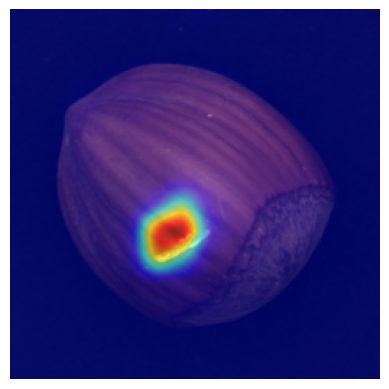

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


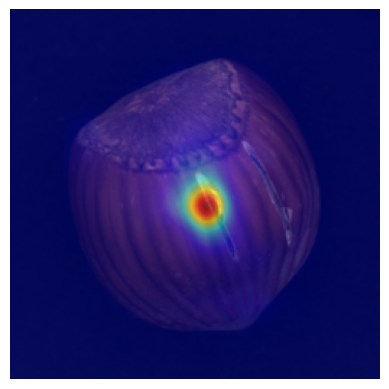

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


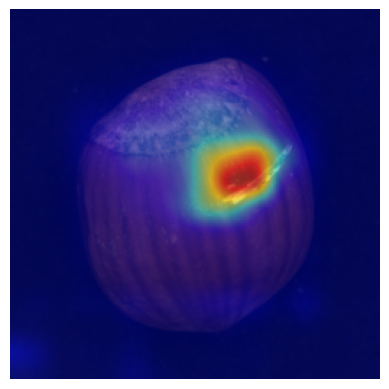

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


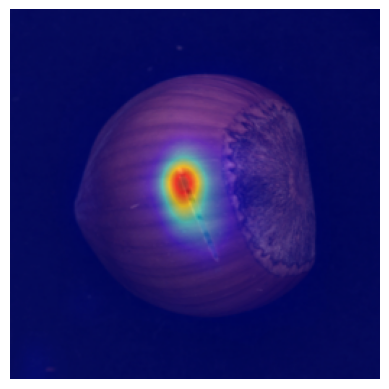

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


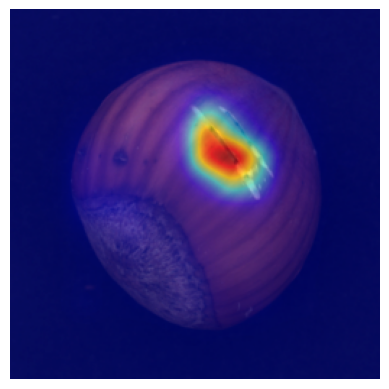

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


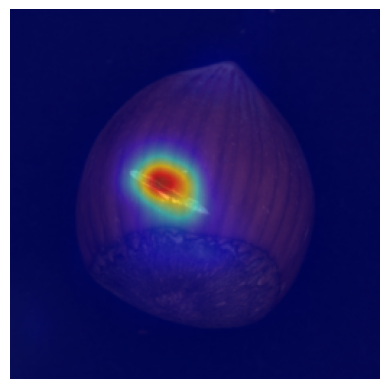

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


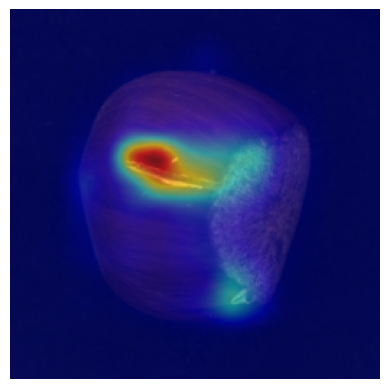

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


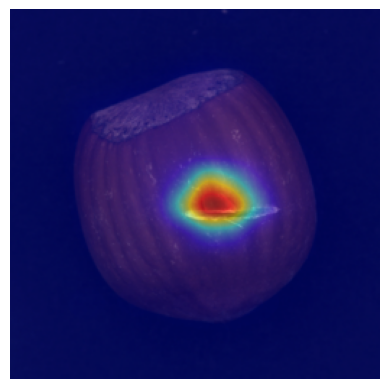

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


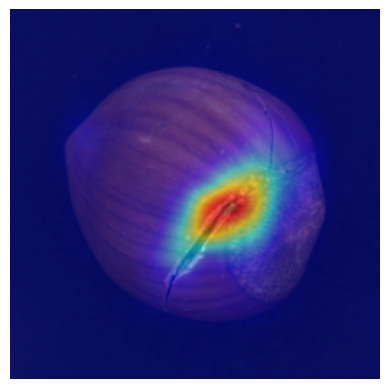

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


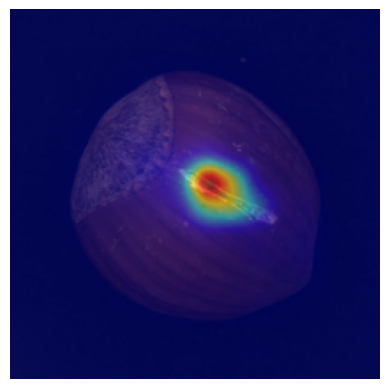

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


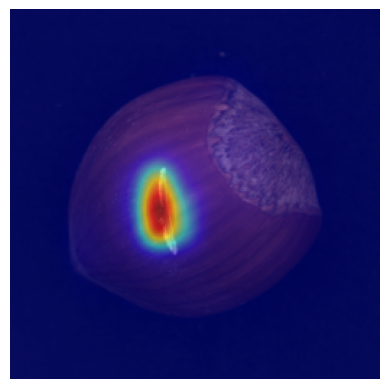

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


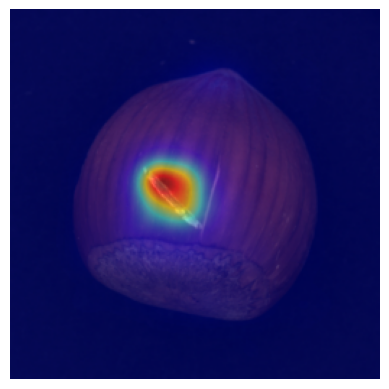

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


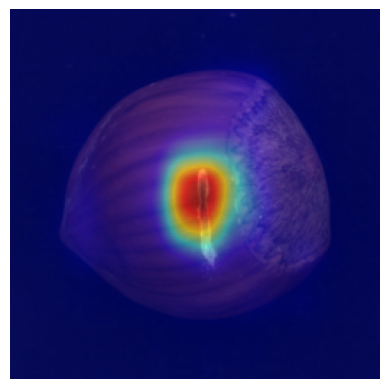

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


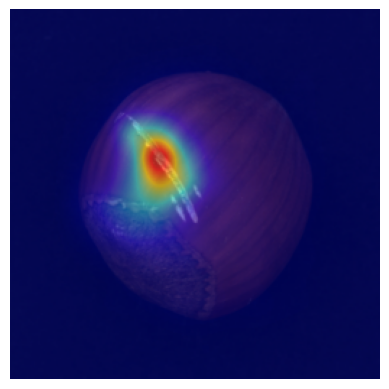

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


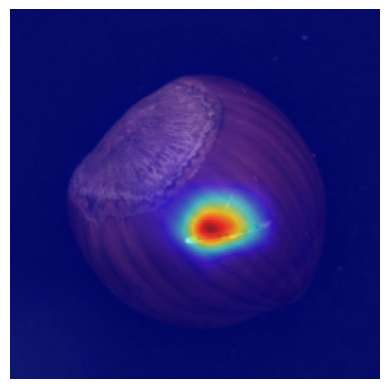

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


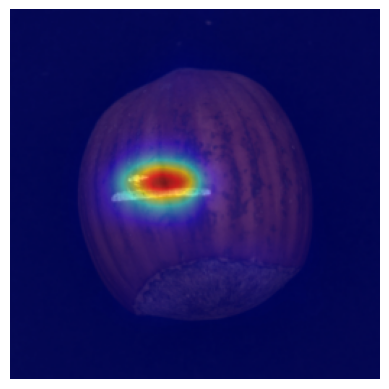

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


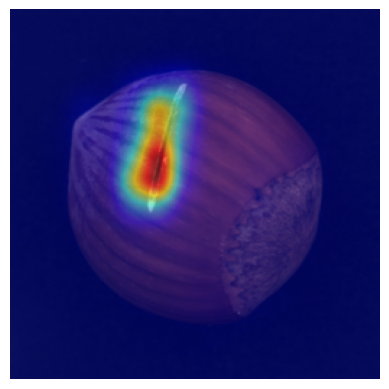

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


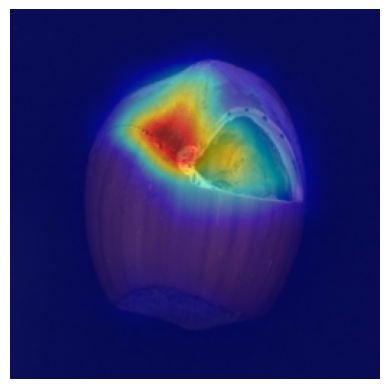

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


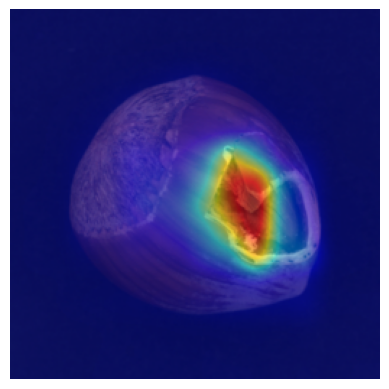

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


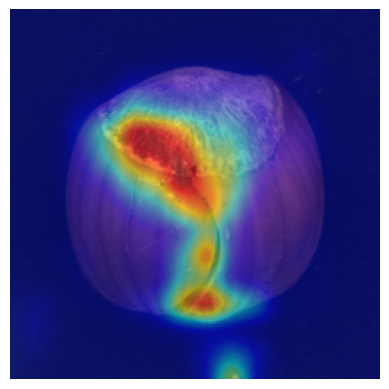

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


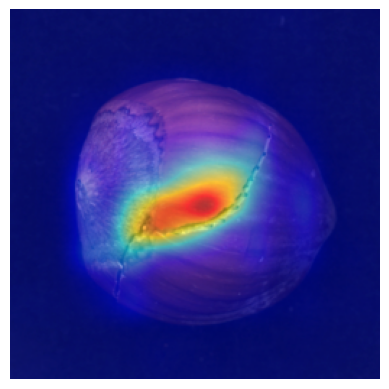

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


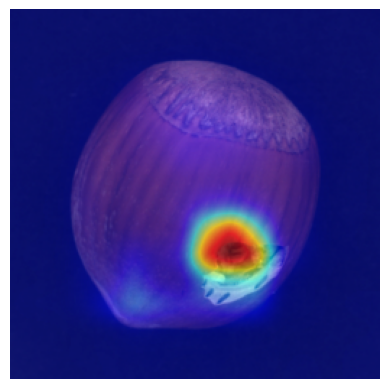

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


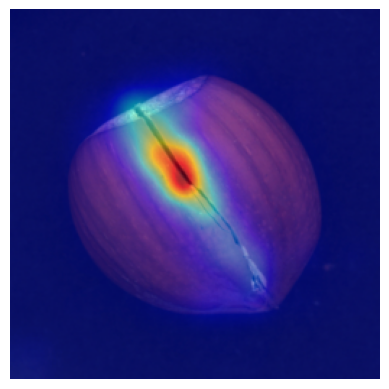

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


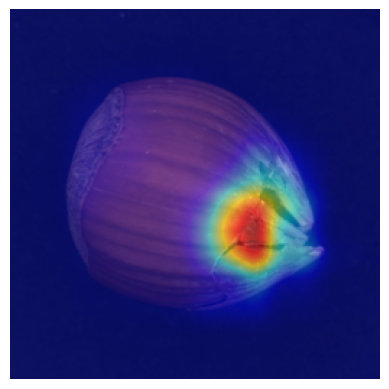

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


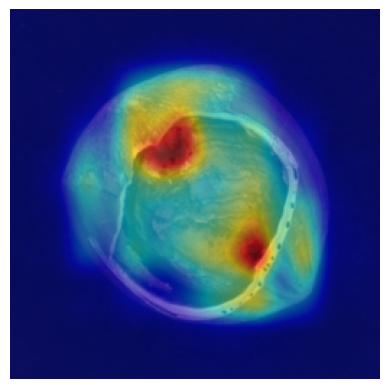

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


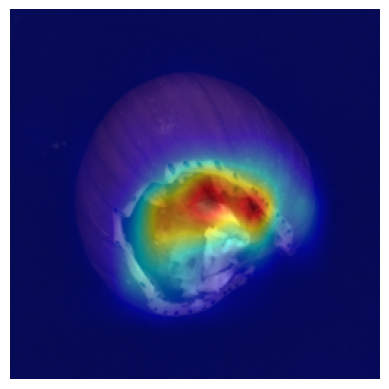

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


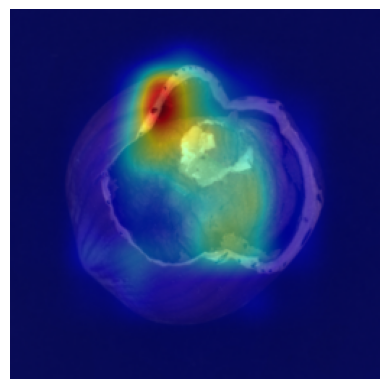

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


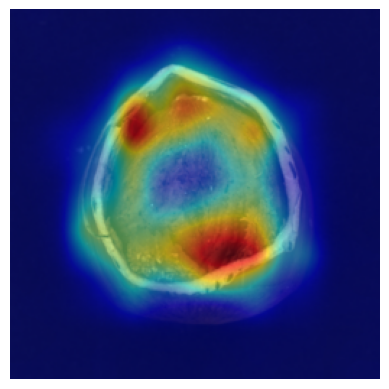

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


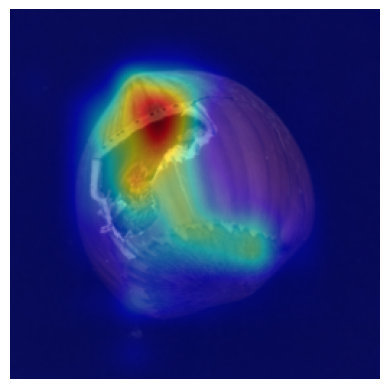

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


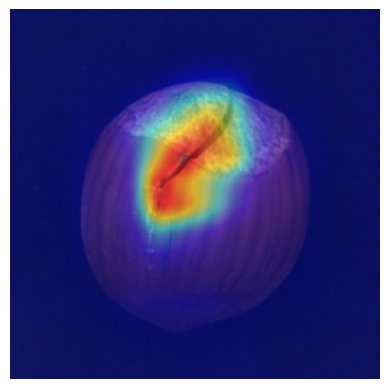

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


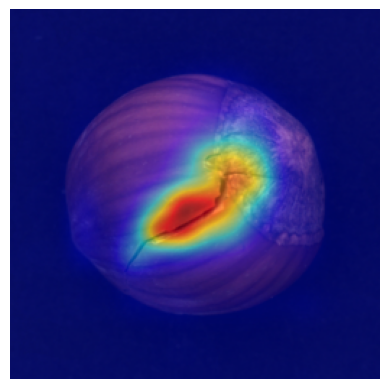

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


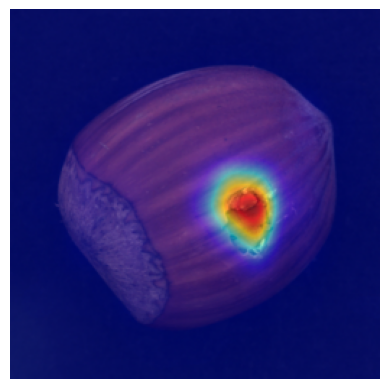

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


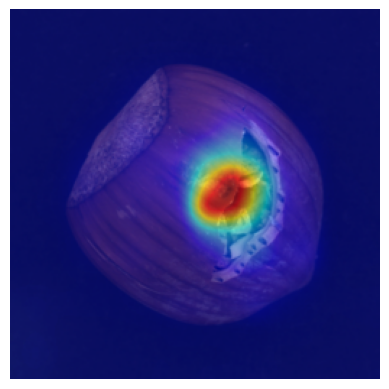

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


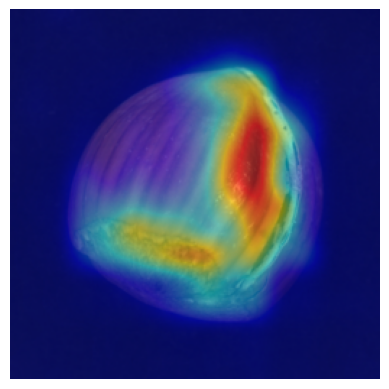

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


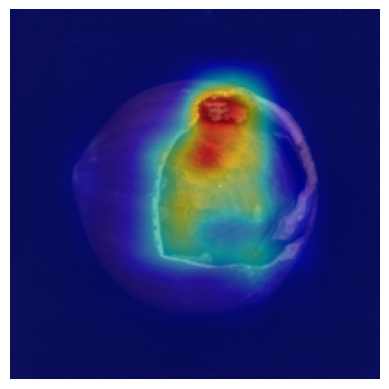

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


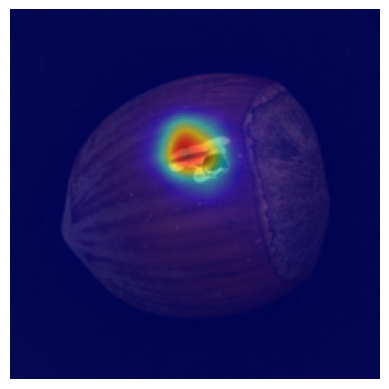

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


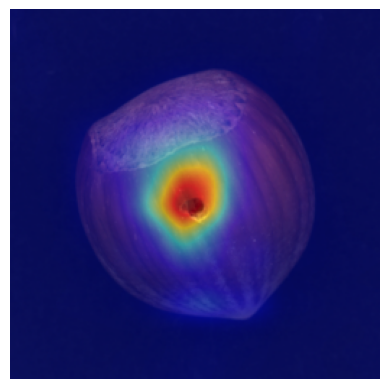

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


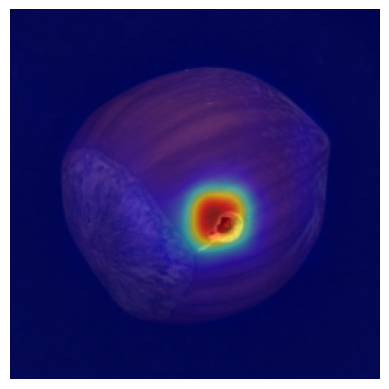

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


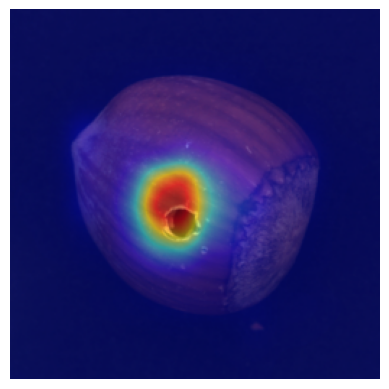

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


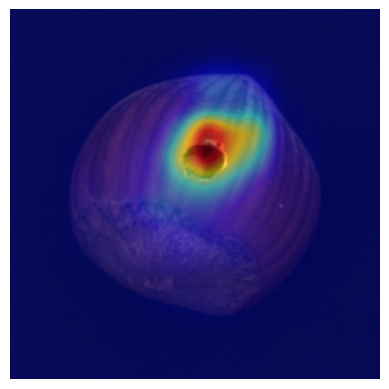

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


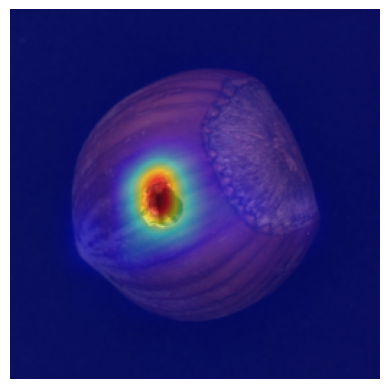

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


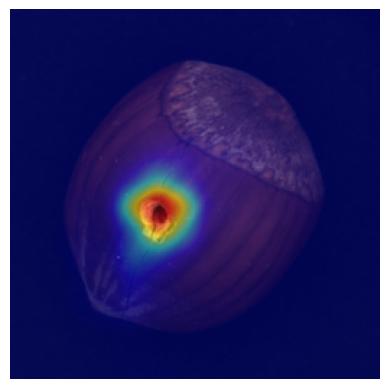

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


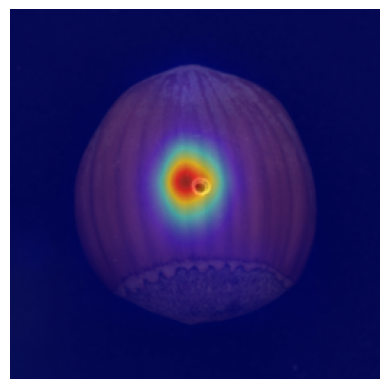

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


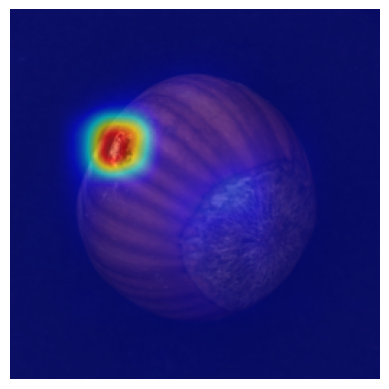

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


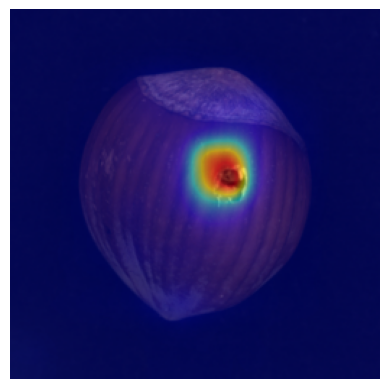

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


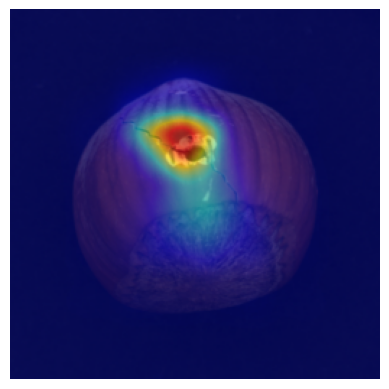

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


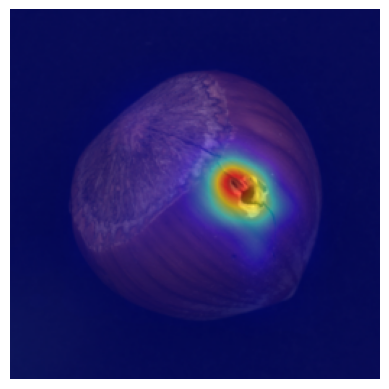

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


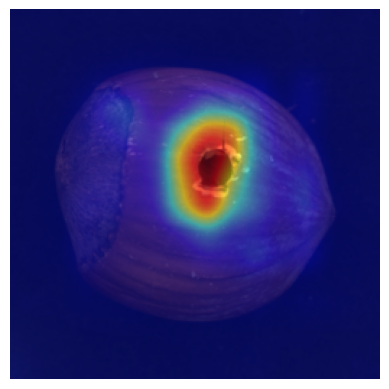

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


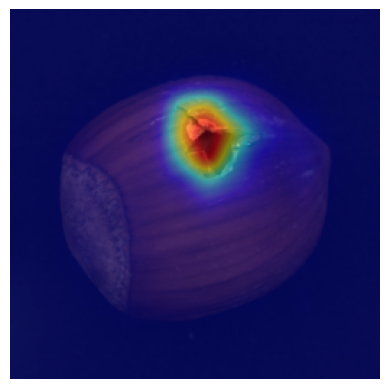

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


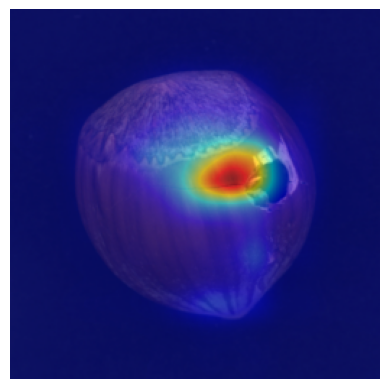

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


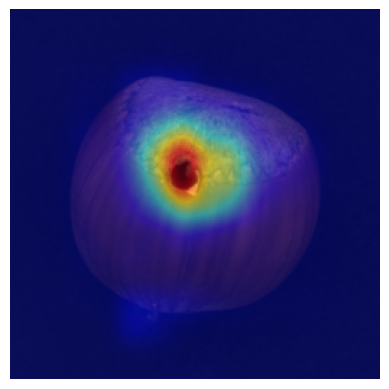

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


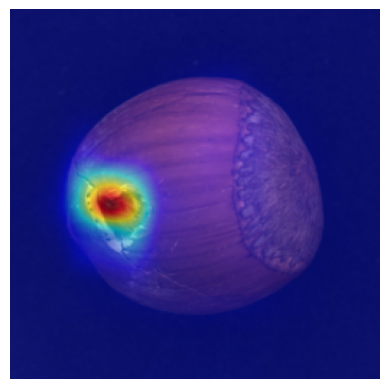

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


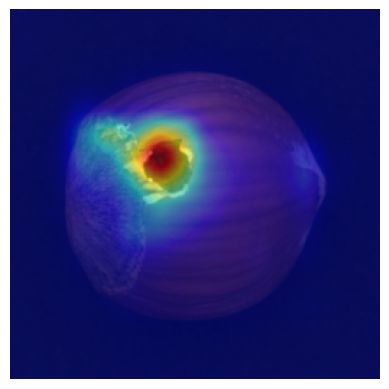

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


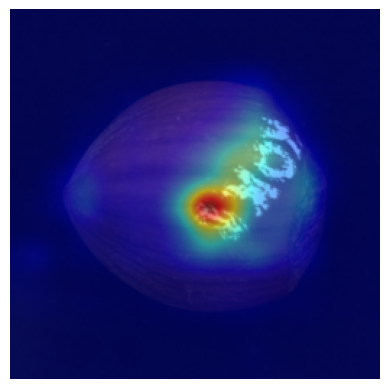

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


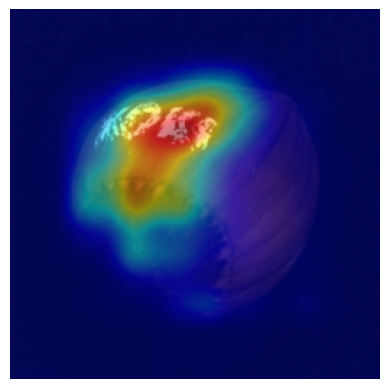

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


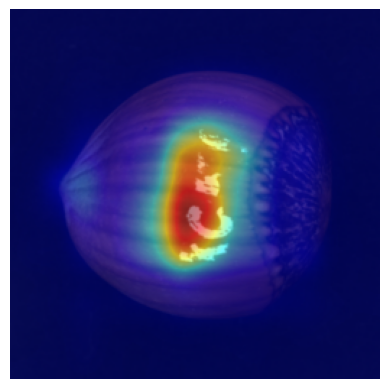

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


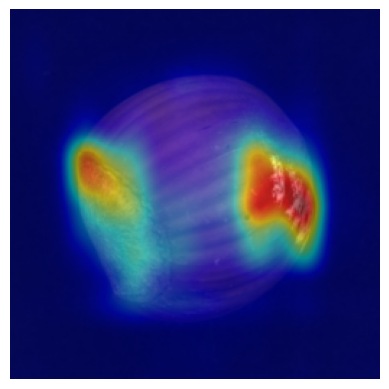

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


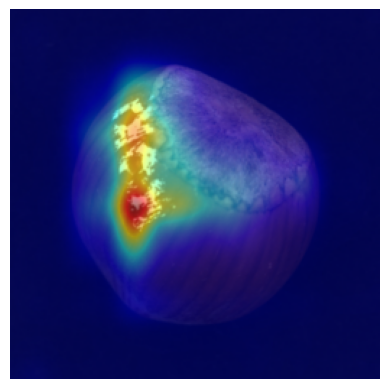

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


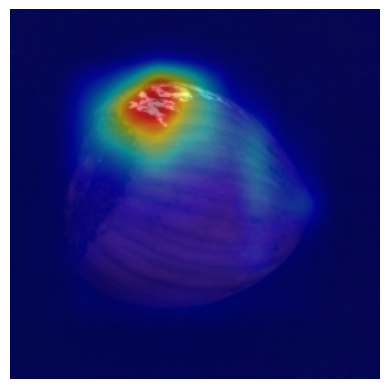

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


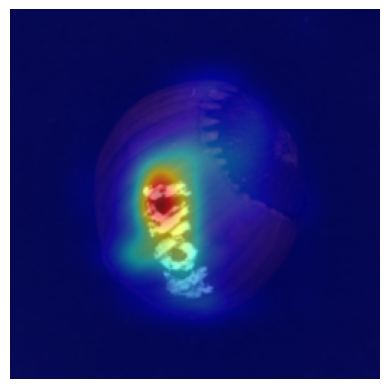

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


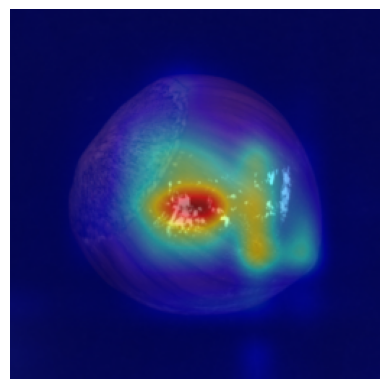

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


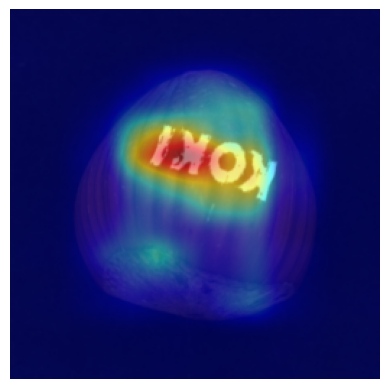

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


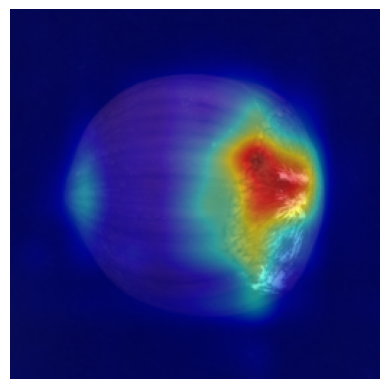

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


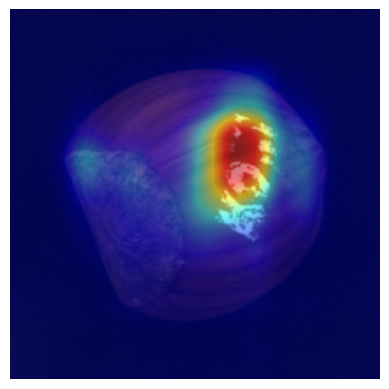

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


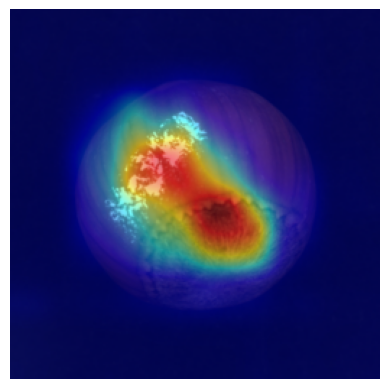

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


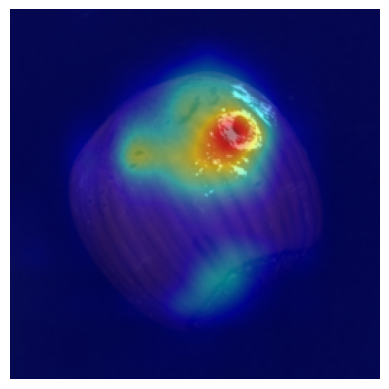

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


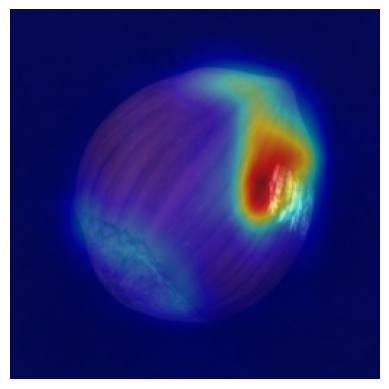

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


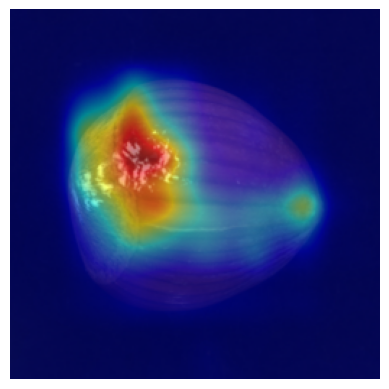

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


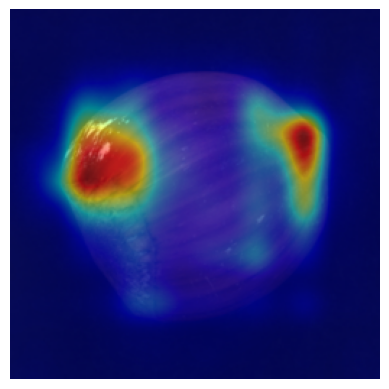

encoder feature_stem size : torch.Size([1, 128, 64, 64])
encoder feature_a size : torch.Size([1, 128, 64, 64])
encoder feature_b size : torch.Size([1, 256, 32, 32])
encoder feature_c size : torch.Size([1, 512, 16, 16])
decoder feature_a : torch.Size([1, 512, 16, 16])
decoder feature_b : torch.Size([1, 256, 32, 32])
decoder feature_c : torch.Size([1, 128, 64, 64])
PATH :  ./시각화/hazelnut/


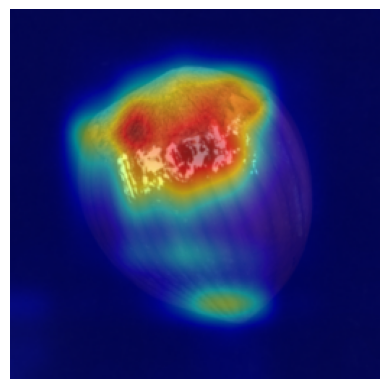

In [42]:
visualization('hazelnut', './시각화/hazelnut/')

# 가장 좋은 Threshold찾기
acc_max : Accuracy의 최댓값 <br>
acc_max_index : Accuracy가 최대일때의 이미지 주소(index) <br>
acc_max_len : Accuracy가 최대일때 주소의 길이 <br>
acc_max_threshold : Accuracy가 max인 threshold 범위 <br>
<br>
acc : Accuracy <br>
prc : Precision <br>
rcl : Recall <br>
f1 : F1-Score <br>
false : Fall_out <br>

# clasification_with_threshold
특정 Threshold일때 성능 평가